# Image classification for birds
This project aimed to configure and train a network to predict the specie of a bird based on its image using different computer vision training techniques including CNN and transfer learning.

## Participants:


*   Esam Al Sakka
*   Kai Paulsen

### Course and Semester
Machine Learning With TensorFlow (SoSe2021)

### Mount Google Drive

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')
CP_PATH = base_dir = os.path.join(os.getcwd(), "drive", "MyDrive", "bird_classification_cp")

Mounted at /content/drive


## Import kaggle dataset

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 62 bytes


In [ ]:
!kaggle datasets download "gpiosenka/100-bird-species"

100% 889M/889M [00:05<00:00, 149MB/s]
100% 889M/889M [00:05<00:00, 157MB/s]


In [ ]:
!unzip 100-bird-species.zip

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
  inflating: train/TOWNSENDS WARBLER/091.jpg  
  inflating: train/TOWNSENDS WARBLER/092.jpg  
  inflating: train/TOWNSENDS WARBLER/093.jpg  
  inflating: train/TOWNSENDS WARBLER/094.jpg  
  inflating: train/TOWNSENDS WARBLER/095.jpg  
  inflating: train/TOWNSENDS WARBLER/096.jpg  
  inflating: train/TOWNSENDS WARBLER/097.jpg  
  inflating: train/TOWNSENDS WARBLER/098.jpg  
  inflating: train/TOWNSENDS WARBLER/099.jpg  
  inflating: train/TOWNSENDS WARBLER/100.jpg  
  inflating: train/TOWNSENDS WARBLER/101.jpg  
  inflating: train/TOWNSENDS WARBLER/102.jpg  
  inflating: train/TOWNSENDS WARBLER/103.jpg  
  inflating: train/TOWNSENDS WARBLER/104.jpg  
  inflating: train/TOWNSENDS WARBLER/105.jpg  
  inflating: train/TOWNSENDS WARBLER/106.jpg  
  inflating: train/TOWNSENDS WARBLER/107.jpg  
  inflating: train/TOWNSENDS WARBLER/108.jpg  
  inflating: train/TOWNSENDS WARBLER/109.jpg  
  inflating: train/TOWNSENDS WARBLER/110

### Imports, helper functions and model specifications

In [ ]:
import numpy as np
import os
import tensorflow as tf
import keras_preprocessing
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
from keras.applications.vgg16 import preprocess_input

In [ ]:
# Parameter
TRAINING_DIR = "train/"
TEST_DIR = "test/"
VALIDATION_DIR = "valid/"

In [ ]:
def create_checkpoint_callback(path, model_name):
  checkpoint_path = os.path.join(path, "cp_{}.ckpt".format(model_name))   
  checkpoint_dir = os.path.dirname(checkpoint_path)

  # Create a callback that saves the model's weights
  return tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                  save_weights_only=True,
                                                  verbose=1)

In [ ]:
def save_h5(model, path, model_name):
  model.save(os.path.join(path, "{}.h5".format(model_name))) 

In [ ]:
def set_augmentation(
    rotation_range=40, width_shift_range=.2, height_shift_range=.2, shear_range=.2, zoom_range=.2, 
    horizontal_flip=True):
    
    training_datagen = ImageDataGenerator(
        rescale=1. / 255,
        preprocessing_function=preprocess_input,
        rotation_range=rotation_range,
        width_shift_range=width_shift_range,
        height_shift_range=height_shift_range,
        shear_range=shear_range,
        zoom_range=zoom_range,
        horizontal_flip=horizontal_flip,
        fill_mode='nearest')

    validation_datagen = ImageDataGenerator(        rescale=1. / 255,preprocessing_function=preprocess_input)
    test_datagen = ImageDataGenerator(        rescale=1. / 255,preprocessing_function=preprocess_input)

    train_generator = training_datagen.flow_from_directory(
        TRAINING_DIR,
        target_size=(224, 224),
        class_mode='categorical',
        #batch_size=32
    )

    validation_generator = validation_datagen.flow_from_directory(
        VALIDATION_DIR,
        target_size=(224, 224),
        class_mode='categorical',
        #batch_size=32
    )

    
    test_generator = test_datagen.flow_from_directory(
        TEST_DIR,
        target_size=(224, 224),
        class_mode='categorical',
        #batch_size=32
    )
    
    return training_datagen, validation_datagen, test_datagen, train_generator, validation_generator, test_generator

In [ ]:
training_datagen, validation_datagen, test_datagen, train_generator, validation_generator, test_generator = set_augmentation()

Found 39364 images belonging to 275 classes.
Found 1375 images belonging to 275 classes.
Found 1375 images belonging to 275 classes.


In [ ]:
def build_model(list_of_convolutions=[], list_of_dense_layers=[], dropout=None, lr=0.001):
  model=tf.keras.models.Sequential()
  model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', input_shape=(224, 224, 3)))
  model.add(tf.keras.layers.MaxPooling2D(2, 2))
  for conv in list_of_convolutions:
      model.add(tf.keras.layers.Conv2D(conv, (3, 3), activation='relu'))
      model.add(tf.keras.layers.MaxPooling2D(2, 2))
      if dropout:
          model.add(tf.keras.layers.Dropout(dropout))
  
  model.add(tf.keras.layers.Flatten())
                
  for dense_layer in list_of_dense_layers:
      model.add(tf.keras.layers.Dense(dense_layer, activation='relu'))
      if dropout:
          model.add(tf.keras.layers.Dropout(dropout))
                
  model.add(tf.keras.layers.Dense(275, activation='softmax'))

  opt=tf.keras.optimizers.Adam(learning_rate=lr)
  model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
      
  model.summary()
  return model

In [ ]:
def build_pretrained_model(list_of_dense_layers=[], dropout=None, lr=0.001, mobilenet=False):
    
    model=tf.keras.models.Sequential()

    if mobilenet:
      base_model = tf.keras.applications.MobileNetV2(
        input_shape=(224,224,3),
        include_top=False,
        weights="imagenet")
    
    else:
      #base_model = tf.keras.applications.Xception(
      #weights='imagenet',  # Load weights pre-trained on ImageNet.
      #input_shape=(224, 224, 3),
      #include_top=False)  # Do not include the ImageNet classifier at the top.
      base_model = tf.keras.applications.VGG16(
          include_top=False,
          weights="imagenet",
          input_shape=(224,224,3))
    
    base_model.trainable = False

    base_model.summary()
    
    model.add(base_model)
    
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.BatchNormalization())
    for dense_layer in list_of_dense_layers:
        model.add(tf.keras.layers.Dense(dense_layer,kernel_initializer='he_normal')) # Initializers define the way to set the initial random weights of Keras layers.
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation('relu'))
        if dropout:
            model.add(tf.keras.layers.Dropout(dropout))
            
    model.add(tf.keras.layers.Dense(275,activation='softmax', kernel_initializer='glorot_normal')) 

    opt=tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
            
    model.summary()
        
    return model

In [ ]:
def plot_epochs(history):
    # plot the accuracy and loss -> no Dropout + Additonal layer
    plt.plot(history.history['accuracy'], label='train')
    plt.plot(history.history['val_accuracy'], label='test')
    plt.title('Plot History: Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

In [ ]:
def plot_epochs_2(history):
  pd.DataFrame(history.history).plot(figsize=(10,8))
  plt.grid(True)
  plt.gca().set_ylim(0, 1)
  plt.show()

In [ ]:
ACCURACY_THRESHOLD = .95
class myCallback(tf.keras.callbacks.Callback): 
  def on_epoch_end(self, epoch, logs={}): 
    if(logs.get('accuracy') > ACCURACY_THRESHOLD):   
      print("\nReached %2.2f%% accuracy, so stopping training!!" %(ACCURACY_THRESHOLD*100))   
      self.model.stop_training = True

In [ ]:
# callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

callback = myCallback()

In [ ]:
lr_schedule = tf.keras.callbacks.LearningRateScheduler(
    lambda epoch: 1e-8 * 10**(epoch / 20))

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

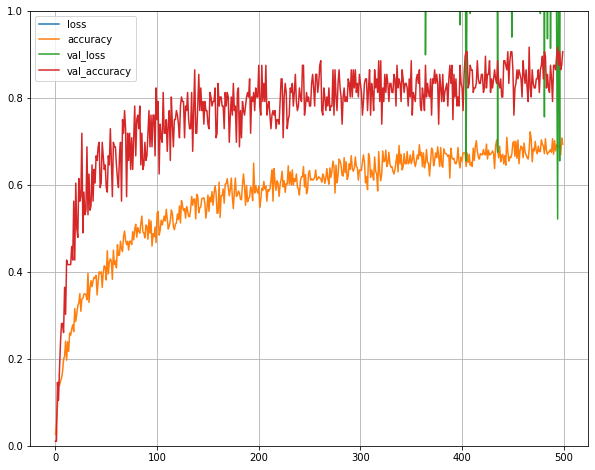

In [ ]:
# Baseline model
baseline_model = build_pretrained_model()

baseline_history = baseline_model.fit(
    train_generator, epochs=500, steps_per_epoch=20,
    validation_data=validation_generator, verbose=1,
    validation_steps=3)

plot_epochs_2(baseline_history)
baseline_model.save_weights(os.path.join(CP_PATH, "cp_{}.ckpt".format("baseline_model")))

In [ ]:
baseline_model.evaluate(test_generator)

In [ ]:
# Basic model without pretraining
basic_wop_model = build_model()

basic_wop_history = basic_wop_model.fit(
    train_generator, epochs=3000, steps_per_epoch=20,
    validation_data=validation_generator, verbose=1,
    validation_steps=3)

plot_epochs_2(basic_wop_history)
basic_wop_model.save_weights(os.path.join(CP_PATH, "cp_{}.ckpt".format("basic_wop_model")))

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

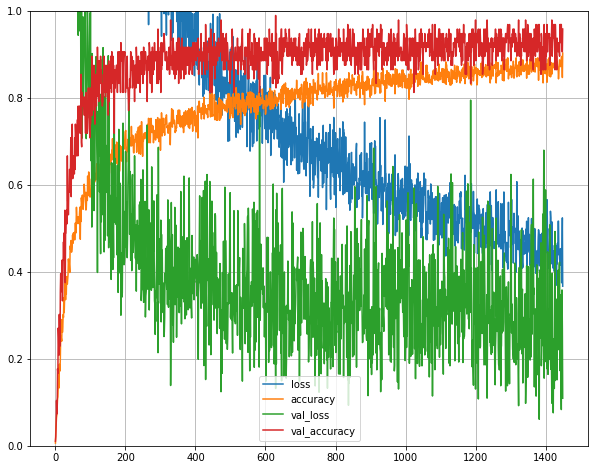

In [ ]:
# Case: two dense layers [2048, 2048] and dropout None
model_1_vgg = build_pretrained_model(list_of_dense_layers=[2048, 2048], dropout=None, lr=0.0001) 

history_1_vgg = model_1_vgg.fit(
    train_generator, epochs=2000, steps_per_epoch=20,
    validation_data=validation_generator, verbose=1,
    validation_steps=3, callbacks=[callback])

plot_epochs_2(history_1_vgg)
model_1_vgg.save_weights(os.path.join(CP_PATH, "cp_{}.ckpt".format("model_1_vgg")))

In [ ]:
model_1_vgg.evaluate(test_generator)

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

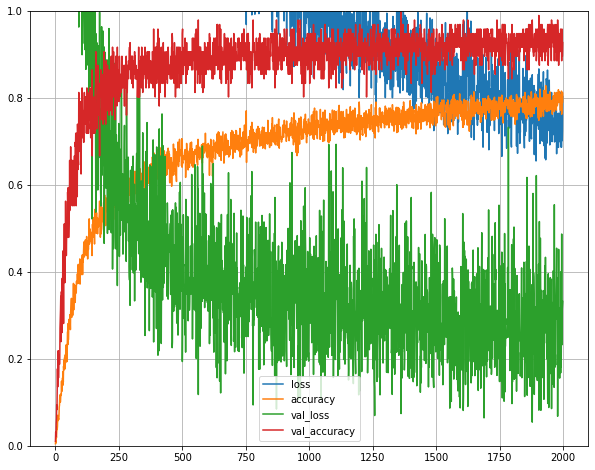

In [ ]:
# Case: two dense layers [2048, 2048] and dropout .35
model_1_vgg_dropout = build_pretrained_model(list_of_dense_layers=[2048, 2048], dropout=.35, lr=0.0001) 

history_1_vgg_dropout = model_1_vgg_dropout.fit(
    train_generator, epochs=2000, steps_per_epoch=20,
    validation_data=validation_generator, verbose=1,
    validation_steps=3, callbacks=[callback])

plot_epochs_2(history_1_vgg_dropout)
model_1_vgg_dropout.save_weights(os.path.join(CP_PATH, "cp_{}.ckpt".format("model_1_vgg_dropout")))

In [ ]:
model_1_vgg_dropout.evaluate(test_generator)

58892288/58889256 [==============================] - 0s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
______________________________________________________________

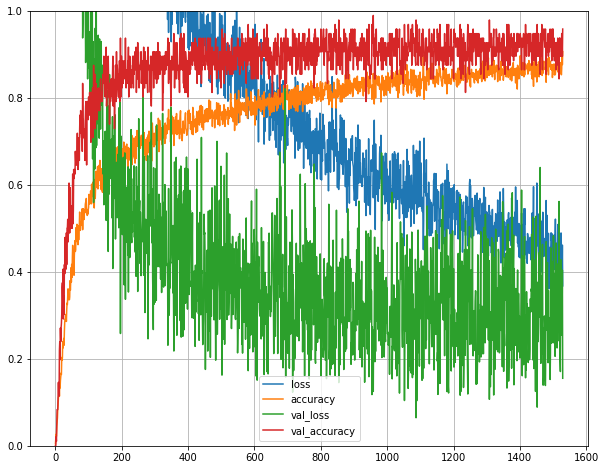

In [ ]:
# Case: three dense layers [2048, 2048, 1024] and dropout None
model_2_vgg = build_pretrained_model(list_of_dense_layers=[2048, 2048, 1024], dropout=None, lr=0.0001) 

history_2_vgg = model_2_vgg.fit(
    train_generator, epochs=2000, steps_per_epoch=20,
    validation_data=validation_generator, verbose=1,
    validation_steps=3, callbacks=[callback])

plot_epochs_2(history_2_vgg)
model_2_vgg.save_weights(os.path.join(CP_PATH, "cp_{}.ckpt".format("model_2_vgg")))

In [ ]:
model_2_vgg.evaluate(test_generator)

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

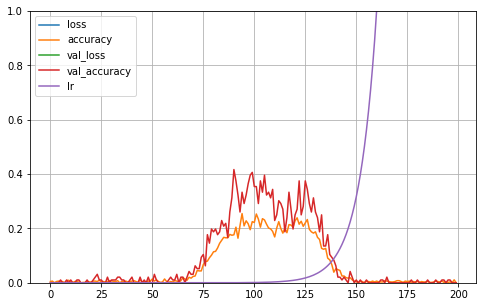

(1e-08, 0.0001, 5.5, 6.5)

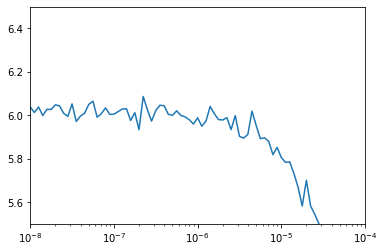

In [ ]:
# Case: dense layers [2048, 2048, 1024] and dropout None
model_2_vgg_lr = build_pretrained_model(list_of_dense_layers=[2048, 2048], dropout=None, lr=0.0001) 

history_2_vgg_lr = model_2_vgg_lr.fit(
    train_generator, epochs=200, steps_per_epoch=20,
    validation_data=validation_generator, verbose=1,
    validation_steps=3, callbacks=[callback, lr_schedule])

plot_epochs_2(history_2_vgg_lr)
plt.semilogx(history_2_vgg_lr.history["lr"], history_2_vgg_lr.history["loss"])
plt.axis([1e-8, 1e-4, 5.5, 6.5])

(1e-08, 100000.0, 1.0, 6.5)

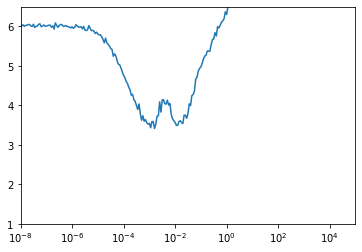

In [ ]:
plt.semilogx(history_2_vgg_lr.history["lr"], history_2_vgg_lr.history["loss"])
plt.axis([1e-8, 1e5, 1, 6.5])

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_12[0][0]                   
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
_______________________________________________________________________________

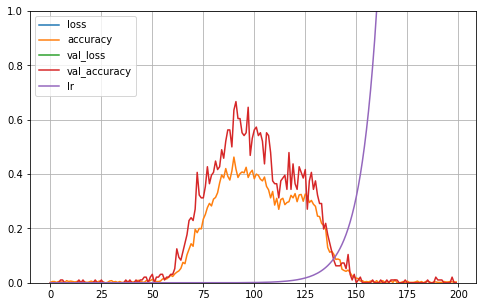

In [ ]:
# Case: dense layers [2048, 2048] and dropout None, Mobile NetV2
model_mobilenet_lr = build_pretrained_model(list_of_dense_layers=[2048, 2048], dropout=None, lr=0.0001, mobilenet=True) 

history_mobilenet_lr = model_mobilenet_lr.fit(
    train_generator, epochs=2, steps_per_epoch=20,
    validation_data=validation_generator, verbose=1,
    validation_steps=3, callbacks=[callback, lr_schedule])

plot_epochs_2(history_mobilenet_lr)

(1e-08, 100000.0, 1.0, 6.5)

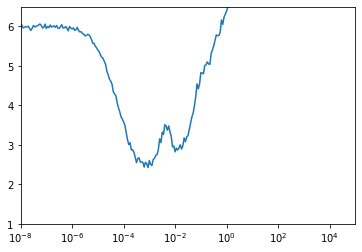

In [ ]:
plt.semilogx(history_mobilenet_lr.history["lr"], history_mobilenet_lr.history["loss"])
plt.axis([1e-8, 1e5, 1, 6.5])

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_3[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
_______________________________________________________________________________

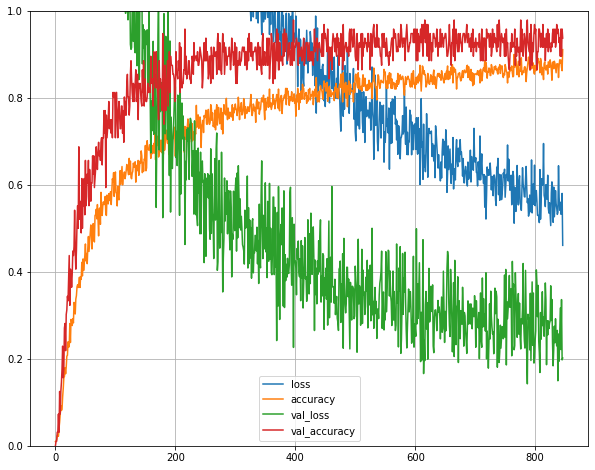

In [ ]:
# Case: dense layers [2048, 2048] and dropout None, Mobile NetV2
model_mobilenet = build_pretrained_model(list_of_dense_layers=[2048, 2048], dropout=None, lr=0.00001, mobilenet=True) 

history_mobilenet = model_mobilenet.fit(
    train_generator, epochs=2000, steps_per_epoch=20,
    validation_data=validation_generator, verbose=1,
    validation_steps=3, callbacks=[callback])

plot_epochs_2(history_mobilenet)
model_mobilenet.save_weights(os.path.join(CP_PATH, "cp_{}.ckpt".format("model_mobilenet")))

In [ ]:
model_mobilenet.evaluate(test_generator)

43/43 [==============================] - 4s 91ms/step - loss: 0.2683 - accuracy: 0.9425


[0.26827096939086914, 0.942545473575592]

In [ ]:
# Case: dense layers [2048, 2048] and dropout None, Mobile NetV2
model_mobilenet_2 = build_pretrained_model(list_of_dense_layers=[2048, 2048], dropout=None, lr=0.00001, mobilenet=True) 

history_mobilenet_2 = model_mobilenet_2.fit(
    train_generator, epochs=4000, steps_per_epoch=20,
    validation_data=validation_generator, verbose=1,
    validation_steps=3, callbacks=[callback])

plot_epochs_2(history_mobilenet_2)
model_mobilenet_2.save_weights(os.path.join(CP_PATH, "cp_{}.ckpt".format("model_mobilenet_2")))

In [ ]:
model_mobilenet_2.evaluate(test_generator)

In [ ]:
# Create a new model instance
model_mobilenet_trained = build_pretrained_model(list_of_dense_layers=[2048, 2048], dropout=None, lr=0.00001, mobilenet=True) 

# Restore the weights
model_mobilenet_trained.load_weights(os.path.join(CP_PATH, "cp_{}.ckpt".format('model_mobilenet')))
model_mobilenet_trained.evaluate(test_generator)
# save_h5(model=model_mobilenet_trained, path=CP_PATH, model_name='model_mobilenet')

In [ ]:
# Create a new model instance
model_mobilenet_2_trained = build_pretrained_model(list_of_dense_layers=[2048, 2048], dropout=None, lr=0.00001, mobilenet=True) 

# Restore the weights
model_mobilenet_2_trained.load_weights(os.path.join(CP_PATH, "cp_{}.ckpt".format('model_mobilenet_2')))
model_mobilenet_2_trained.evaluate(test_generator)
# save_h5(model=model_mobilenet_trained, path=CP_PATH, model_name='model_mobilenet')

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
_______________________________________________________________________________

[0.19429022073745728, 0.95127272605896]

In [ ]:
model_mobilenet_2_trained.evaluate(test_generator)

43/43 [==============================] - 4s 81ms/step - loss: 0.1943 - accuracy: 0.9513


[0.1942901462316513, 0.95127272605896]

In [ ]:
def output(location, model, max_values):
    dic = train_generator.class_indices
    icd = {k:v for v,k in dic.items()}
    img = image.load_img(location,target_size=(224,224,3))
    img = image.img_to_array(img)
    img = img/255
    img = np.expand_dims(img,[0])
    x = model.predict(img)
    if max_values:
      # print(x)
      # print(x.shape)
      ind = np.argpartition(x[0], -max_values)[-max_values:]
      # print(ind)
      answer = x[0][ind]
      probability = np.around(x[0][ind]*100,2) 
      # print(icd)
      return probability, {icd[v]: probability[i] for i, v in enumerate(ind)}
    else:
      answer = np.argmax(x, axis=-1)
      probability = round(np.max(x)*100,2)    
      return probability, icd[answer[0]]

In [ ]:
def predict_test_image(model, image_path, max_values=1):
  pic=image.load_img(image_path,target_size=(224,224,3))
  plt.figure()
  plt.imshow(pic)
  plt.title(image_path)
  prob, name = output(image_path, model, max_values)
  if max_values:
    sorted_values = {k: v for k, v in sorted(name.items(), key=lambda item: item[1], reverse=True)}
    # print(sorted_values)
    pd.DataFrame(index=[0], data=sorted_values).T.plot.barh()

  # print([str(key) +": "+str(value) for key, value in sorted_values.items()])
  # label = plt.xlabel(str(prob) + ' % chances are there that the bird is ' + name)
  # if name not in image_path:
  #  label.set_color("red")
 

### Prediction of bird images


In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/GRAY CATBIRD/1.jpg", max_values=5)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


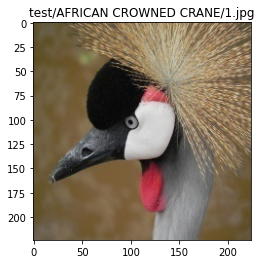

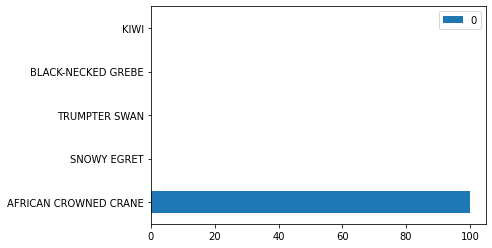

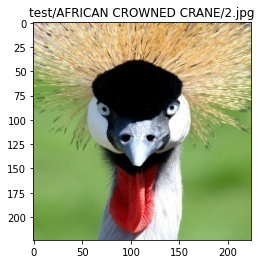

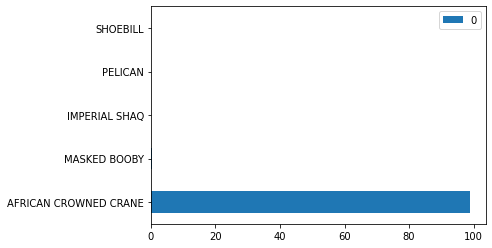

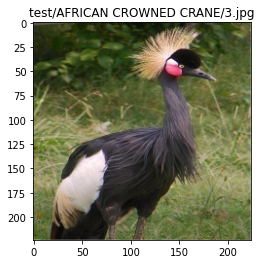

...

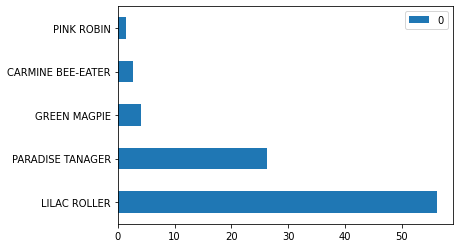

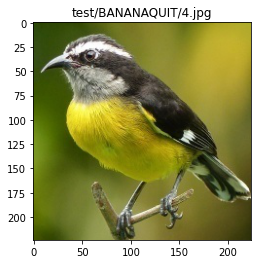

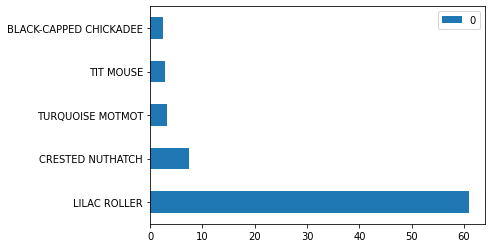

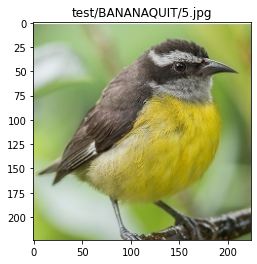

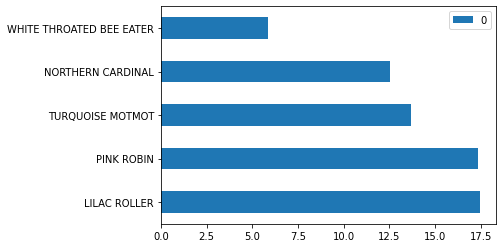

In [ ]:
for img in range(0, 100):
  predict_test_image(model_mobilenet_2_trained, image_path=test_generator.filepaths[img], max_values=5)

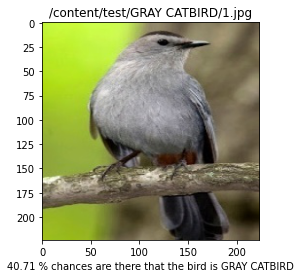

In [ ]:
predict_test_image("/content/test/GRAY CATBIRD/1.jpg")

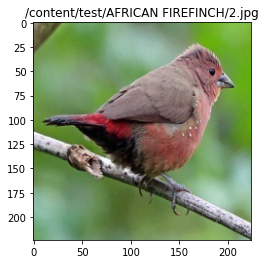

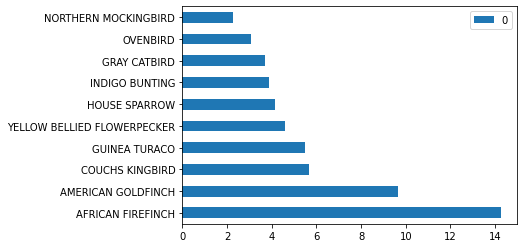

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/AFRICAN FIREFINCH/2.jpg", max_values=10)

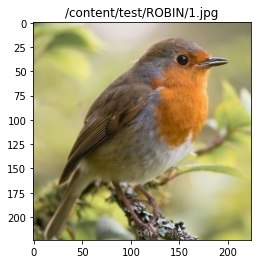

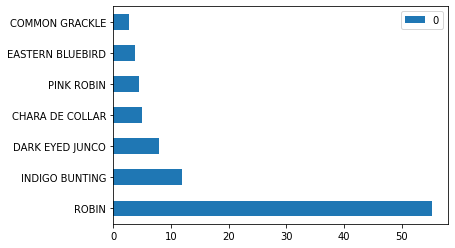

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/ROBIN/1.jpg", max_values=7)

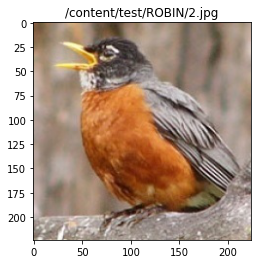

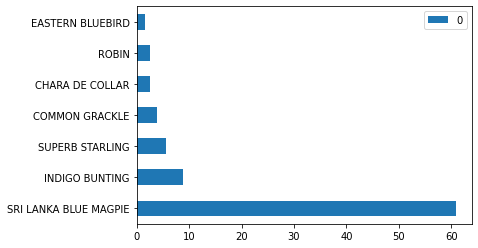

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/ROBIN/2.jpg", max_values=7)

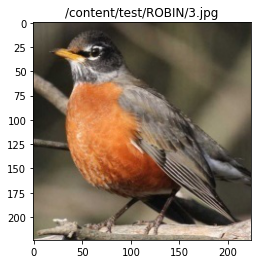

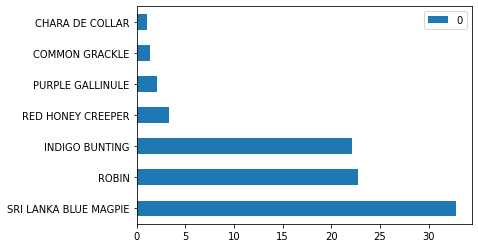

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/ROBIN/3.jpg", max_values=7)

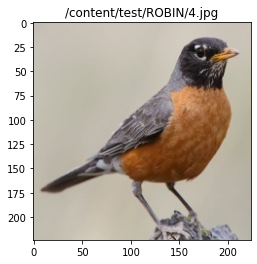

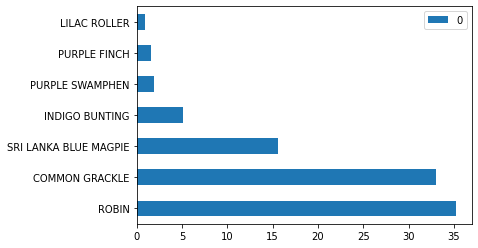

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/ROBIN/4.jpg", max_values=7)

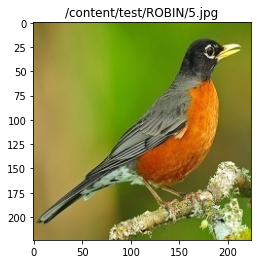

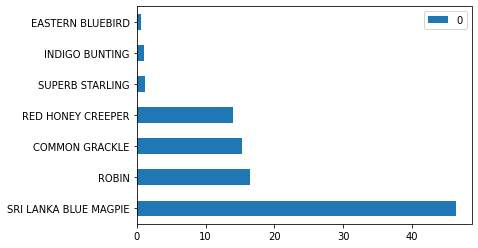

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/ROBIN/5.jpg", max_values=7)

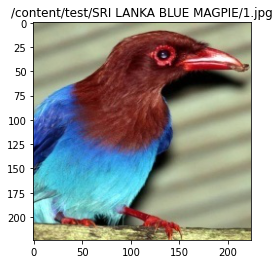

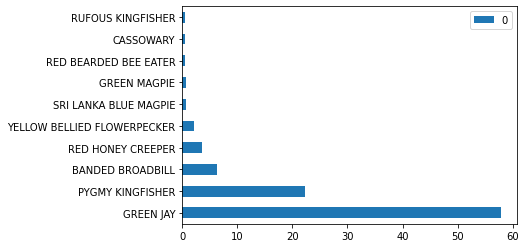

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/SRI LANKA BLUE MAGPIE/1.jpg", max_values=10)

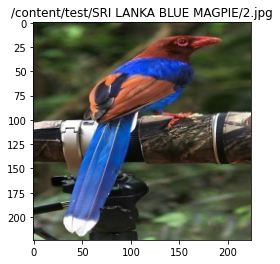

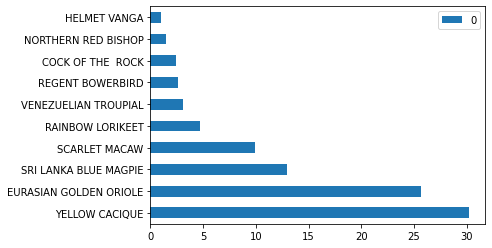

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/SRI LANKA BLUE MAGPIE/2.jpg", max_values=10)

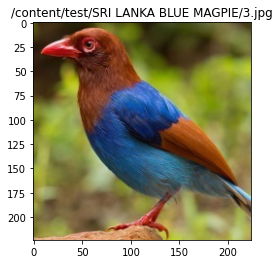

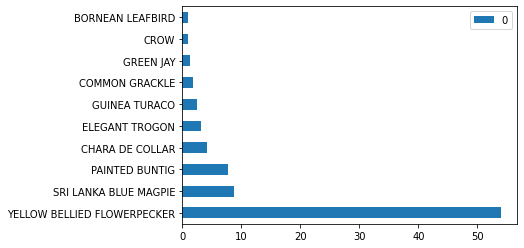

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/SRI LANKA BLUE MAGPIE/3.jpg", max_values=10)

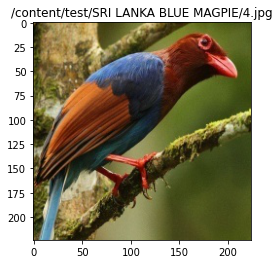

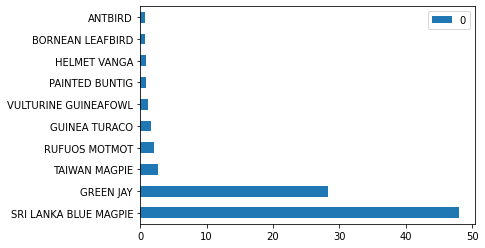

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/SRI LANKA BLUE MAGPIE/4.jpg", max_values=10)

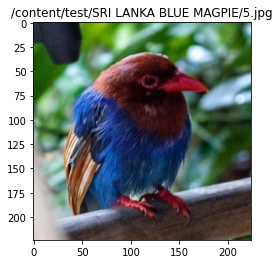

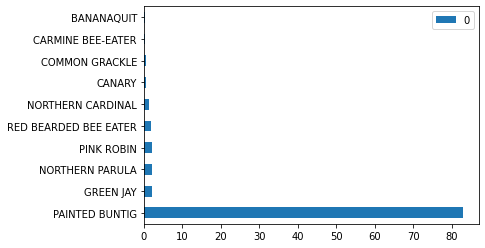

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/SRI LANKA BLUE MAGPIE/5.jpg", max_values=10)

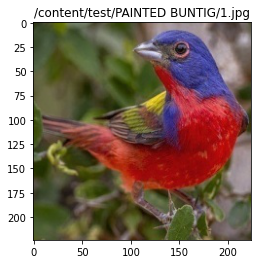

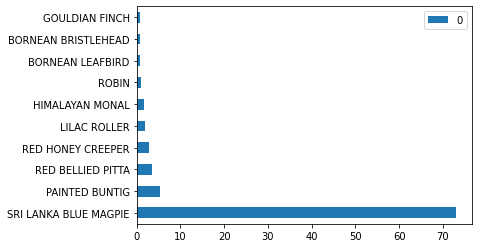

In [ ]:
predict_test_image(model_mobilenet_2_trained, "/content/test/PAINTED BUNTIG/1.jpg", max_values=10)